In [11]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
import time
import matplotlib.animation as animation
from IPython.display import HTML

In [7]:
################## Market parameters #################
T = 1
sigma = 0.2
nu = sigma**2/2
######################################################

############### Simulations parameters ###############
N_h = 201
N_T = 100
dt = T/N_T
h = 1/(N_h - 1)
time_grid = np.arange(0, T+dt, dt)
space_grid = np.arange(0, 1+h, h)
newton_stopping_criteria = 1e-11 # do not change
picard_stopping_criteria = 1e-2 # 1e-1 is a bit too high. 1e-6 would be ideal, but computations are slow.
theta = 0.1 # if it does not converge, set to 0.01 or less. To make computations faster, set to 0.5
beta = 2 # test 2, 1.1, 4
######################################################

##################### Functions ######################
def g(x):
    return - np.exp(-40 * (x - 0.5)**2)
#     return - np.exp(-40 * (x - 1/3)**2) - np.exp(-40 * (x - 2/3)**2)

def H0(x, p1, p2):
    return 1/beta * ((np.minimum(0, p1))**2 + (np.maximum(0, p2))**2)**(beta/2) - g(x)

def f0_tilde(m):
#     return m/10
    return m*10

def phi(x):
    return - np.exp(-40 * (x - 0.7)**2)

def m0(x):
    return np.exp(-3000 * (x - 0.2)**2)

def m0_hat(x):
    return m0(x)
######################################################

In [3]:
############### Differential operators ###############
# (DW_i)_{0 \leq i < N_h}
Dx = np.diag([-1]*N_h) + np.diag([1]*(N_h-1), k=1)
Dx[N_h-1, N_h-1] = 0
Dx = Dx/h

# (DW_{i-1})_{0 \leq i < N_h}
Dx_shift = np.diag([1]*N_h) + np.diag([-1]*(N_h-1), k=-1)
Dx_shift[0, 0] = 0
Dx_shift = Dx_shift/h

# Laplacian, 0 \leq i < N_h
Dx2 = np.diag([-2]*N_h) + np.diag([1]*(N_h-1), k=1) + np.diag([1]*(N_h-1), k=-1)
Dx2[0, 0], Dx2[N_h-1, N_h-1] = -1, -1
Dx2 = Dx2/h**2
######################################################

In [4]:
############## Computing useful matrices #############
def compute_F(U_next, U_now, M):
    F = - (U_next - U_now)/dt - nu*Dx2@U_now
    F += 1/beta * (np.minimum(Dx@U_now, 0)**2 + (np.maximum(Dx_shift@U_now, 0))**2)**(beta/2)
    F += - g(space_grid) - f0_tilde(M)
    
    return F

def compute_JH(U):
    backward_spatial_diff = np.maximum(Dx_shift@U, 0) # max(U^n_i - U^n_(i-1), 0)
    forward_spatial_diff = - np.minimum(Dx@U, 0) # - min(U^n_(i+1) - U^n, 0)
    coef = backward_spatial_diff**2 + forward_spatial_diff**2
    coef = np.power(coef, beta/2-1, out=np.zeros_like(coef), where=(coef!=0))

    main_diag = (1/h * (forward_spatial_diff + backward_spatial_diff) * coef)
    sub_diag = (- 1/h* backward_spatial_diff * coef)[1:]
    sup_diag = (- 1/h * forward_spatial_diff * coef)[:-1]
    JH = np.diag(sub_diag, k=-1) + np.diag(main_diag) + np.diag(sup_diag, k=+1)

    return JH

def compute_J_banded(U):
    backward_spatial_diff = np.maximum(Dx_shift@U, 0) # max(U^n_i - U^n_(i-1), 0)
    forward_spatial_diff = - np.minimum(Dx@U, 0) # - min(U^n_(i+1) - U^n, 0)
    coef = backward_spatial_diff**2 + forward_spatial_diff**2
    coef = np.power(coef, beta/2-1, out=np.zeros_like(coef), where=(coef!=0))
    
    sub_diag = (- 1/h* backward_spatial_diff * coef)[1:]
    main_diag = (1/h * (forward_spatial_diff + backward_spatial_diff) * coef)
    sup_diag = (- 1/h * forward_spatial_diff * coef)[:-1]
    
    banded_matrix = np.zeros((3, U.size))
    banded_matrix[0, 1:] = sup_diag - nu/h**2
    banded_matrix[1] = main_diag + 1/dt + 2*nu/h**2
    banded_matrix[2, :-1] = sub_diag - nu/h**2
    return banded_matrix
######################################################

In [5]:
############## Solving HJB equation ##################
def Newton_Raphson(U, M):
    # Initialization
    U_k = U.copy()

    k = 0
    normF = np.inf
    while normF > newton_stopping_criteria:
        F = compute_F(U, U_k, M)
        J = compute_J_banded(U_k)
        U_k = U_k - scipy.linalg.solve_banded((1, 1), J, F)
        normF = np.linalg.norm(F)
        k += 1

    return U_k

def solve_HJB(M):
    # Initialization
    U_hat = np.zeros(M.shape)
    U_hat[N_T] = phi(space_grid)

    # Backward loop
    for n in range(N_T-1, -1, -1):
        U_hat[n] = Newton_Raphson(U_hat[n+1], M[n+1])

    return U_hat
######################################################

In [6]:
############## Solving KFP equation ##################
def solve_KFP(U):
    # Initialization
    M_hat = np.zeros(U.shape)
    M_hat[0] = m0_hat(space_grid)
    
    # Forward loop
    for n in range(N_T):
        JH = compute_JH(U[n])
        M_hat[n+1] = np.linalg.solve(np.identity(N_h) - nu*dt*Dx2+dt*JH.T, M_hat[n])

    return M_hat
######################################################

In [7]:
############ Solving the whole system ################
def Picard(U_old, M_old):

    t0 = time.time()
    k = 0
    norm_increment = np.inf
    while norm_increment > picard_stopping_criteria:
        print(f"[Picard] Iteration {k}, previous norm: {norm_increment}, elapsed time: {time.time() - t0}")
        U_hat = solve_HJB(M_old)
        M_hat = solve_KFP(U_hat)

        U_new = (1 - theta) * U_old + theta * U_hat
        M_new = (1 - theta) * M_old + theta * M_hat

        increment = np.hstack((U_new - U_old, M_new - M_old))
        norm_increment = np.linalg.norm(increment)
        k += 1

        U_old, M_old = U_new, M_new

    return U_new, M_new
######################################################

In [9]:
################# Computing results ###################
M = np.zeros((N_T+1, N_h))
M[:] = m0_hat(space_grid)

U = np.zeros((N_T+1, N_h))
U[:] = phi(space_grid)

U_picard, M_picard = Picard(U, M)
######################################################

[Picard] Iteration 0, previous norm: inf, elapsed time: 0.0
[Picard] Iteration 1, previous norm: 11.599486837153739, elapsed time: 4.072632074356079
[Picard] Iteration 2, previous norm: 9.505943030960937, elapsed time: 8.214556455612183
[Picard] Iteration 3, previous norm: 7.864155784206338, elapsed time: 11.679540395736694
[Picard] Iteration 4, previous norm: 6.550601732958275, elapsed time: 16.034330368041992
[Picard] Iteration 5, previous norm: 5.481999685746754, elapsed time: 20.03375768661499
[Picard] Iteration 6, previous norm: 4.603339578743285, elapsed time: 24.058814525604248
[Picard] Iteration 7, previous norm: 3.876708806750914, elapsed time: 28.117151498794556
[Picard] Iteration 8, previous norm: 3.2743072703638503, elapsed time: 32.003098011016846
[Picard] Iteration 9, previous norm: 2.774679963068728, elapsed time: 35.992374420166016
[Picard] Iteration 10, previous norm: 2.3606554268485933, elapsed time: 39.981165170669556
[Picard] Iteration 11, previous norm: 2.018167823

[Picard] Iteration 892, previous norm: 0.02840404708879959, elapsed time: 827.343695640564
[Picard] Iteration 893, previous norm: 0.028286640861277926, elapsed time: 828.1983096599579
[Picard] Iteration 894, previous norm: 0.028215493104258506, elapsed time: 829.0710315704346
[Picard] Iteration 895, previous norm: 0.028196436788373146, elapsed time: 829.9042916297913
[Picard] Iteration 896, previous norm: 0.02816030317935853, elapsed time: 830.7611320018768
[Picard] Iteration 897, previous norm: 0.028221633754229456, elapsed time: 831.5973653793335
[Picard] Iteration 898, previous norm: 0.028090042310873677, elapsed time: 832.4362995624542
[Picard] Iteration 899, previous norm: 0.027986848091034734, elapsed time: 833.2624142169952
[Picard] Iteration 900, previous norm: 0.028004859828926813, elapsed time: 834.1239111423492
[Picard] Iteration 901, previous norm: 0.0279707283000262, elapsed time: 834.9655802249908
[Picard] Iteration 902, previous norm: 0.027978474634938143, elapsed time: 

[Picard] Iteration 981, previous norm: 0.025012000662675005, elapsed time: 904.4409246444702
[Picard] Iteration 982, previous norm: 0.024854777997927645, elapsed time: 905.2929711341858
[Picard] Iteration 983, previous norm: 0.0249906418416156, elapsed time: 906.1342809200287
[Picard] Iteration 984, previous norm: 0.024789886824367474, elapsed time: 906.9931797981262
[Picard] Iteration 985, previous norm: 0.024794927840781928, elapsed time: 907.8383936882019
[Picard] Iteration 986, previous norm: 0.02478105959780185, elapsed time: 908.7126140594482
[Picard] Iteration 987, previous norm: 0.024787498531932017, elapsed time: 909.5703701972961
[Picard] Iteration 988, previous norm: 0.024700115410628144, elapsed time: 910.4228208065033
[Picard] Iteration 989, previous norm: 0.024711948041518862, elapsed time: 911.2592933177948
[Picard] Iteration 990, previous norm: 0.024572387457309136, elapsed time: 912.091472864151
[Picard] Iteration 991, previous norm: 0.024595982262643014, elapsed time:

[Picard] Iteration 1069, previous norm: 0.022140747477329973, elapsed time: 979.8618655204773
[Picard] Iteration 1070, previous norm: 0.02200717125875205, elapsed time: 980.7096061706543
[Picard] Iteration 1071, previous norm: 0.021976230510514186, elapsed time: 981.5755279064178
[Picard] Iteration 1072, previous norm: 0.02208115471029956, elapsed time: 982.4201183319092
[Picard] Iteration 1073, previous norm: 0.021931482999167425, elapsed time: 983.2694945335388
[Picard] Iteration 1074, previous norm: 0.021849806782263847, elapsed time: 984.123373746872
[Picard] Iteration 1075, previous norm: 0.02191470548946866, elapsed time: 984.9736590385437
[Picard] Iteration 1076, previous norm: 0.021887658664383306, elapsed time: 985.834897518158
[Picard] Iteration 1077, previous norm: 0.021773760463809945, elapsed time: 986.6862802505493
[Picard] Iteration 1078, previous norm: 0.021904268693025978, elapsed time: 987.5340311527252
[Picard] Iteration 1079, previous norm: 0.021707881944522472, ela

[Picard] Iteration 1157, previous norm: 0.019718240606660185, elapsed time: 1055.7579250335693
[Picard] Iteration 1158, previous norm: 0.019593309802908604, elapsed time: 1056.6257236003876
[Picard] Iteration 1159, previous norm: 0.01958196322436064, elapsed time: 1057.4643206596375
[Picard] Iteration 1160, previous norm: 0.019582005776643707, elapsed time: 1058.3219513893127
[Picard] Iteration 1161, previous norm: 0.019431587846365436, elapsed time: 1059.177820444107
[Picard] Iteration 1162, previous norm: 0.019437314113516718, elapsed time: 1060.022332906723
[Picard] Iteration 1163, previous norm: 0.01944508178099606, elapsed time: 1060.889240026474
[Picard] Iteration 1164, previous norm: 0.019475267051632113, elapsed time: 1061.7335181236267
[Picard] Iteration 1165, previous norm: 0.01934356817084648, elapsed time: 1062.5922574996948
[Picard] Iteration 1166, previous norm: 0.01928431952448062, elapsed time: 1063.4463877677917
[Picard] Iteration 1167, previous norm: 0.019375429218751

[Picard] Iteration 1244, previous norm: 0.01755008912717107, elapsed time: 1130.3750224113464
[Picard] Iteration 1245, previous norm: 0.017446273994945537, elapsed time: 1131.2407553195953
[Picard] Iteration 1246, previous norm: 0.017427922725680632, elapsed time: 1132.0777089595795
[Picard] Iteration 1247, previous norm: 0.017398797026644274, elapsed time: 1132.9391181468964
[Picard] Iteration 1248, previous norm: 0.0173634269944407, elapsed time: 1133.8037362098694
[Picard] Iteration 1249, previous norm: 0.01743130418578711, elapsed time: 1134.7106537818909
[Picard] Iteration 1250, previous norm: 0.017399750975006345, elapsed time: 1135.5647854804993
[Picard] Iteration 1251, previous norm: 0.017286795880879148, elapsed time: 1136.4286620616913
[Picard] Iteration 1252, previous norm: 0.017379245907630524, elapsed time: 1137.2913835048676
[Picard] Iteration 1253, previous norm: 0.017257320617908318, elapsed time: 1138.1500437259674
[Picard] Iteration 1254, previous norm: 0.017221760225

[Picard] Iteration 1331, previous norm: 0.01576177993914173, elapsed time: 1205.2635457515717
[Picard] Iteration 1332, previous norm: 0.01577310288325467, elapsed time: 1206.1233422756195
[Picard] Iteration 1333, previous norm: 0.015722371326017705, elapsed time: 1206.9898505210876
[Picard] Iteration 1334, previous norm: 0.015711817346605164, elapsed time: 1207.852614402771
[Picard] Iteration 1335, previous norm: 0.015648385314656968, elapsed time: 1208.7123787403107
[Picard] Iteration 1336, previous norm: 0.015875552890540465, elapsed time: 1209.5596961975098
[Picard] Iteration 1337, previous norm: 0.015565499502370232, elapsed time: 1210.4213316440582
[Picard] Iteration 1338, previous norm: 0.015490530616825133, elapsed time: 1211.2613928318024
[Picard] Iteration 1339, previous norm: 0.015553739598515474, elapsed time: 1212.1496751308441
[Picard] Iteration 1340, previous norm: 0.015531269486116333, elapsed time: 1213.002851486206
[Picard] Iteration 1341, previous norm: 0.015572450329

[Picard] Iteration 1418, previous norm: 0.014269160085171893, elapsed time: 1279.0749034881592
[Picard] Iteration 1419, previous norm: 0.014321632817213105, elapsed time: 1279.9191405773163
[Picard] Iteration 1420, previous norm: 0.014220856174490669, elapsed time: 1280.7484574317932
[Picard] Iteration 1421, previous norm: 0.014130092232108418, elapsed time: 1281.607122182846
[Picard] Iteration 1422, previous norm: 0.0140984422425354, elapsed time: 1282.4533369541168
[Picard] Iteration 1423, previous norm: 0.014033762192781317, elapsed time: 1283.3157925605774
[Picard] Iteration 1424, previous norm: 0.014053024463065745, elapsed time: 1284.1573746204376
[Picard] Iteration 1425, previous norm: 0.014268385453944961, elapsed time: 1285.0158355236053
[Picard] Iteration 1426, previous norm: 0.014125141282273882, elapsed time: 1285.8865637779236
[Picard] Iteration 1427, previous norm: 0.01411765793082366, elapsed time: 1286.7211344242096
[Picard] Iteration 1428, previous norm: 0.014230600365

[Picard] Iteration 1505, previous norm: 0.012876436168538162, elapsed time: 1352.9765710830688
[Picard] Iteration 1506, previous norm: 0.012849794429000643, elapsed time: 1353.8041851520538
[Picard] Iteration 1507, previous norm: 0.013068614527285471, elapsed time: 1354.6736183166504
[Picard] Iteration 1508, previous norm: 0.01276207868163603, elapsed time: 1355.5205948352814
[Picard] Iteration 1509, previous norm: 0.012748592776834716, elapsed time: 1356.3761882781982
[Picard] Iteration 1510, previous norm: 0.012842528447520084, elapsed time: 1357.2536447048187
[Picard] Iteration 1511, previous norm: 0.013099296664668646, elapsed time: 1358.095229625702
[Picard] Iteration 1512, previous norm: 0.012833610295153869, elapsed time: 1358.9336373806
[Picard] Iteration 1513, previous norm: 0.012689218815771508, elapsed time: 1359.7997572422028
[Picard] Iteration 1514, previous norm: 0.012808121904002307, elapsed time: 1360.66104054451
[Picard] Iteration 1515, previous norm: 0.012791107327545

[Picard] Iteration 1592, previous norm: 0.0117914720216545, elapsed time: 1427.012534379959
[Picard] Iteration 1593, previous norm: 0.011891049932504899, elapsed time: 1427.8534054756165
[Picard] Iteration 1594, previous norm: 0.011804435472427304, elapsed time: 1428.679277420044
[Picard] Iteration 1595, previous norm: 0.011791808973269875, elapsed time: 1429.5327854156494
[Picard] Iteration 1596, previous norm: 0.011939922429123711, elapsed time: 1430.363512992859
[Picard] Iteration 1597, previous norm: 0.011762420973586391, elapsed time: 1431.18123960495
[Picard] Iteration 1598, previous norm: 0.011746638297224516, elapsed time: 1432.012791633606
[Picard] Iteration 1599, previous norm: 0.011754894915939593, elapsed time: 1432.8756835460663
[Picard] Iteration 1600, previous norm: 0.011711044286036651, elapsed time: 1433.7194616794586
[Picard] Iteration 1601, previous norm: 0.011646743813008007, elapsed time: 1434.5675120353699
[Picard] Iteration 1602, previous norm: 0.0116976516580660

[Picard] Iteration 1679, previous norm: 0.010853796085683355, elapsed time: 1500.845974445343
[Picard] Iteration 1680, previous norm: 0.010808299977505632, elapsed time: 1501.6883964538574
[Picard] Iteration 1681, previous norm: 0.010762617891263537, elapsed time: 1502.5253417491913
[Picard] Iteration 1682, previous norm: 0.010736867905208844, elapsed time: 1503.3733820915222
[Picard] Iteration 1683, previous norm: 0.010697060741685247, elapsed time: 1504.2223477363586
[Picard] Iteration 1684, previous norm: 0.011073533330626018, elapsed time: 1505.0960676670074
[Picard] Iteration 1685, previous norm: 0.010754757861635236, elapsed time: 1505.9089970588684
[Picard] Iteration 1686, previous norm: 0.010629145576874667, elapsed time: 1506.7894899845123
[Picard] Iteration 1687, previous norm: 0.010667566554404553, elapsed time: 1507.6283864974976
[Picard] Iteration 1688, previous norm: 0.010962904371911133, elapsed time: 1508.4592082500458
[Picard] Iteration 1689, previous norm: 0.010759082

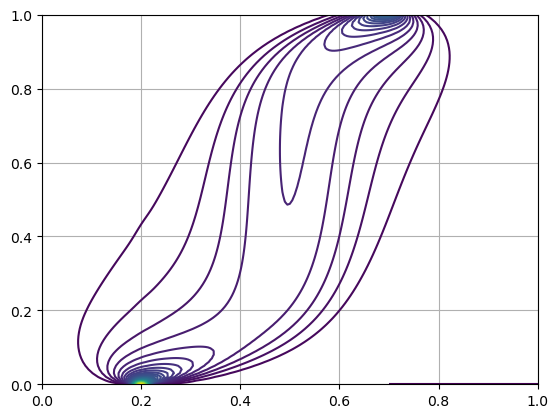

In [10]:
################# Plotting results ###################

# test with beta = 2 et  g(x) = - np.exp(-40 * (x - 0.5)**2)

plt.contour(space_grid, time_grid, M_picard, levels=50)
plt.grid()
plt.show()
######################################################

In [11]:
(M_picard>=0).all()

True

In [12]:
M_picard.sum(axis=1)

array([6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208638,
       6.47208638, 6.47208638, 6.47208638, 6.47208638, 6.47208

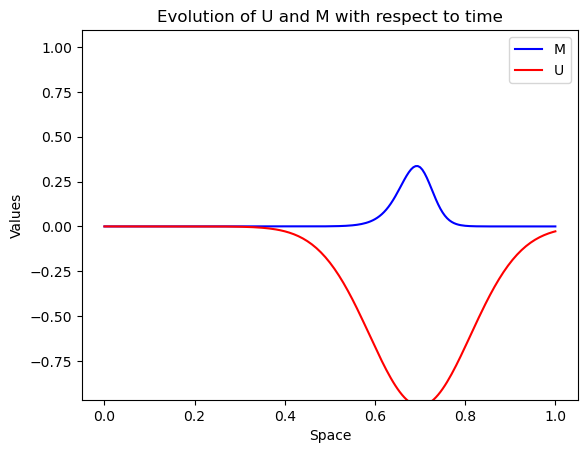

In [15]:
M = M_picard
U = U_picard

fig, ax = plt.subplots()

line1, = ax.plot(space_grid, M[0, :], color='blue', label='M')
line2, = ax.plot(space_grid, U[0, :], color='red', label='U')

ax.legend(loc='best')
ax.set_title('Evolution of U and M with respect to time')
ax.set_xlabel('Space')
ax.set_ylabel('Values')

# Fonction d'initialisation pour l'animation
def init():
    line1.set_ydata([np.nan] * len(space_grid))
    line2.set_ydata([np.nan] * len(space_grid))
    return line1, line2,

# Fonction d'animation
def animate(i):
    line1.set_ydata(M[i, :])  # mise à jour des données de la ligne 1
    line2.set_ydata(U[i, :])  # mise à jour des données de la ligne 2
    return line1, line2,

# Création de l'animation
ani = animation.FuncAnimation(
    fig, animate, init_func=init, interval=100, blit=True, save_count=len(time_grid))

# Affichage de l'animation
HTML(ani.to_jshtml())


In [16]:
# test with beta = 4

beta = 4
U_picard2, M_picard2 = Picard(U, M)

[Picard] Iteration 0, previous norm: inf, elapsed time: 0.0
[Picard] Iteration 1, previous norm: 1.0775860969792286, elapsed time: 4.448001146316528
[Picard] Iteration 2, previous norm: 0.909142441709556, elapsed time: 8.536121845245361
[Picard] Iteration 3, previous norm: 0.8070950760573693, elapsed time: 12.19279170036316
[Picard] Iteration 4, previous norm: 0.72995898115783, elapsed time: 16.24917221069336
[Picard] Iteration 5, previous norm: 0.6652022080742603, elapsed time: 19.983216285705566
[Picard] Iteration 6, previous norm: 0.6075998315056701, elapsed time: 24.005797147750854
[Picard] Iteration 7, previous norm: 0.5547766719205831, elapsed time: 27.85003423690796
[Picard] Iteration 8, previous norm: 0.5058990778472567, elapsed time: 31.525604009628296
[Picard] Iteration 9, previous norm: 0.46067903263545645, elapsed time: 35.5238311290741
[Picard] Iteration 10, previous norm: 0.4189673574247829, elapsed time: 39.45144462585449
[Picard] Iteration 11, previous norm: 0.380619532

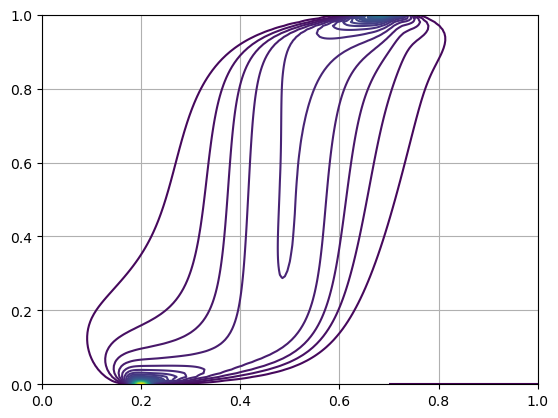

In [17]:
################# Plotting results ###################

# test with beta = 4 et  g(x) = - np.exp(-40 * (x - 0.5)**2)

plt.contour(space_grid, time_grid, M_picard2, levels=50)
plt.grid()
plt.show()
######################################################

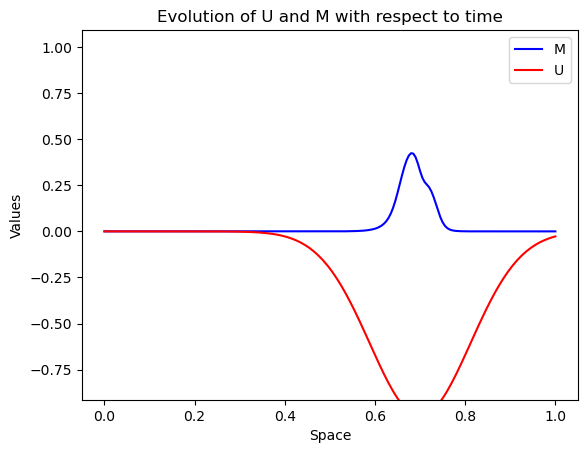

In [19]:
M2 = M_picard2
U2 = U_picard2

fig, ax = plt.subplots()

line1, = ax.plot(space_grid, M2[0, :], color='blue', label='M')
line2, = ax.plot(space_grid, U2[0, :], color='red', label='U')

ax.legend(loc='best')
ax.set_title('Evolution of U and M with respect to time')
ax.set_xlabel('Space')
ax.set_ylabel('Values')

# Fonction d'initialisation pour l'animation
def init():
    line1.set_ydata([np.nan] * len(space_grid))
    line2.set_ydata([np.nan] * len(space_grid))
    return line1, line2,

# Fonction d'animation
def animate(i):
    line1.set_ydata(M2[i, :])  # mise à jour des données de la ligne 1
    line2.set_ydata(U2[i, :])  # mise à jour des données de la ligne 2
    return line1, line2,

# Création de l'animation
ani = animation.FuncAnimation(
    fig, animate, init_func=init, interval=100, blit=True, save_count=len(time_grid))

# Affichage de l'animation
HTML(ani.to_jshtml())


In [20]:
# test with beta = 2 and g(x) = - np.exp(-40 * (x - 1/3)**2) - np.exp(-40 * (x - 2/3)**2)

def g(x):
    return - np.exp(-40 * (x - 1/3)**2) - np.exp(-40 * (x - 2/3)**2)

beta = 2

U_picard3, M_picard3 = Picard(U, M)

[Picard] Iteration 0, previous norm: inf, elapsed time: 0.0
[Picard] Iteration 1, previous norm: 3.7175853094255262, elapsed time: 3.697675943374634
[Picard] Iteration 2, previous norm: 3.050426267282256, elapsed time: 7.5169899463653564
[Picard] Iteration 3, previous norm: 2.594056394766848, elapsed time: 11.498851776123047
[Picard] Iteration 4, previous norm: 2.2159978629331154, elapsed time: 15.619603157043457
[Picard] Iteration 5, previous norm: 1.9104193241288392, elapsed time: 19.783970594406128
[Picard] Iteration 6, previous norm: 1.6584923753660796, elapsed time: 23.903076171875
[Picard] Iteration 7, previous norm: 1.4482242703826198, elapsed time: 28.062947273254395
[Picard] Iteration 8, previous norm: 1.2707450780158671, elapsed time: 32.063929319381714
[Picard] Iteration 9, previous norm: 1.1194639401865623, elapsed time: 36.18038868904114
[Picard] Iteration 10, previous norm: 0.9894214332284746, elapsed time: 40.37044048309326
[Picard] Iteration 11, previous norm: 0.8768338

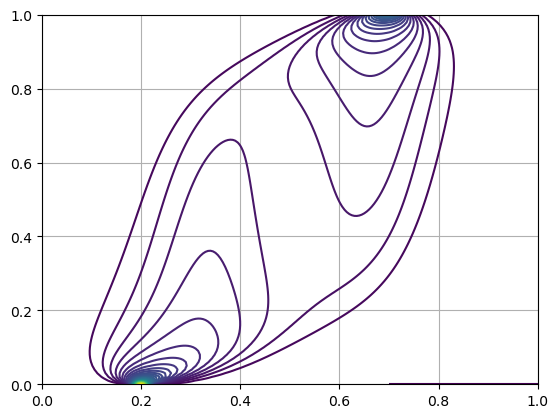

In [21]:
################# Plotting results ###################

# test with beta = 2 et  g(x) = - np.exp(-40 * (x - 1/3)**2) - np.exp(-40 * (x - 2/3)**2)

plt.contour(space_grid, time_grid, M_picard3, levels=50)
plt.grid()
plt.show()
######################################################

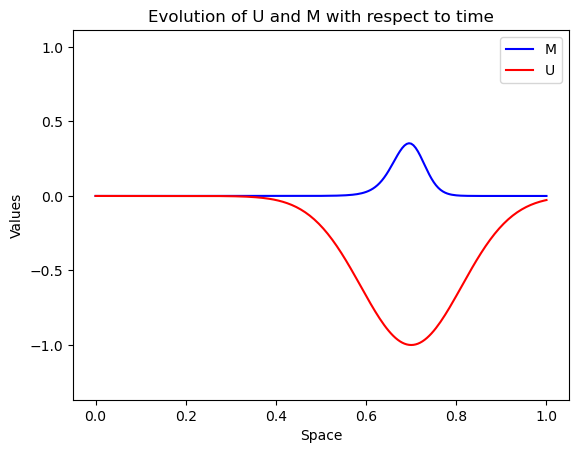

In [22]:
M3 = M_picard3
U3 = U_picard3

fig, ax = plt.subplots()

line1, = ax.plot(space_grid, M3[0, :], color='blue', label='M')
line2, = ax.plot(space_grid, U3[0, :], color='red', label='U')

ax.legend(loc='best')
ax.set_title('Evolution of U and M with respect to time')
ax.set_xlabel('Space')
ax.set_ylabel('Values')

# Fonction d'initialisation pour l'animation
def init():
    line1.set_ydata([np.nan] * len(space_grid))
    line2.set_ydata([np.nan] * len(space_grid))
    return line1, line2,

# Fonction d'animation
def animate(i):
    line1.set_ydata(M3[i, :])  # mise à jour des données de la ligne 1
    line2.set_ydata(U3[i, :])  # mise à jour des données de la ligne 2
    return line1, line2,

# Création de l'animation
ani = animation.FuncAnimation(
    fig, animate, init_func=init, interval=100, blit=True, save_count=len(time_grid))

# Affichage de l'animation
HTML(ani.to_jshtml())


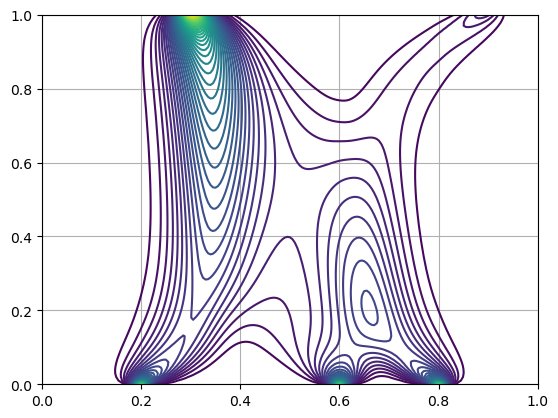

In [14]:
m1 = np.load(r'C:\Users\Alouadi\Desktop\M_beta2_g_complex_f_thin_phi_complex.npy')
u1 = np.load(r'C:\Users\Alouadi\Desktop\U_beta2_g_complex_f_thin_phi_complex.npy')

plt.contour(space_grid, time_grid, m1, levels=50)
plt.grid()
plt.show()

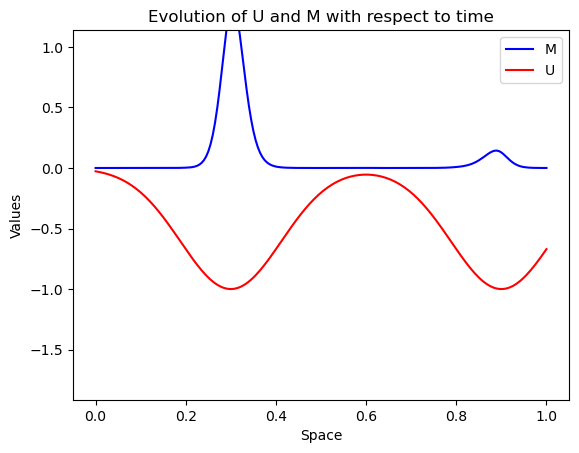

In [15]:
M3 = m1
U3 = u1

fig, ax = plt.subplots()

line1, = ax.plot(space_grid, M3[0, :], color='blue', label='M')
line2, = ax.plot(space_grid, U3[0, :], color='red', label='U')

ax.legend(loc='best')
ax.set_title('Evolution of U and M with respect to time')
ax.set_xlabel('Space')
ax.set_ylabel('Values')

# Fonction d'initialisation pour l'animation
def init():
    line1.set_ydata([np.nan] * len(space_grid))
    line2.set_ydata([np.nan] * len(space_grid))
    return line1, line2,

# Fonction d'animation
def animate(i):
    line1.set_ydata(M3[i, :])  # mise à jour des données de la ligne 1
    line2.set_ydata(U3[i, :])  # mise à jour des données de la ligne 2
    return line1, line2,

# Création de l'animation
ani = animation.FuncAnimation(
    fig, animate, init_func=init, interval=100, blit=True, save_count=len(time_grid))


# Affichage de l'animation
HTML(ani.to_jshtml())